## 0. Import des librairies


In [1]:
%load_ext autoreload
%autoreload 2

from keras.models import Sequential, load_model
from keras.layers import Dense, Dropout, Conv2D, MaxPool2D, Flatten
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Model
from keras.preprocessing import image
from tensorflow.keras.callbacks import EarlyStopping

import numpy as np
import matplotlib.pyplot as plt
plt.style.use("fivethirtyeight")

from src import fonctions

Using TensorFlow backend.


## 1. Paramétrage de l'application

In [2]:
# Chemins du projet
DATA_ROOT = "data/"
MODELS_ROOT = "saved_models/"
TRAINING_PATH = DATA_ROOT + "cifar_lite/train"
TESTING_PATH = DATA_ROOT + "cifar_lite/test"
CIFAR_LITE = "data/cifar_lite"

# Autres paramètres
epochs = 50
img_size = 32

## 2. Optimisation et selection des données

In [4]:
# Afin d'optimiser les performances et de travailler avec moins de données nous décidons de diminuer les 100 catégories du fichier "cifar" en 3 catégories prises au hasard
fonctions.clean_lite(3, CIFAR_LITE)

## 3. Chargement des données


In [5]:
# Convertion des futurs images RBG en niveaux de gris (0 == noir, 255 == blanc)
train_datagen = ImageDataGenerator(rescale = 1./255)
test_datagen = ImageDataGenerator(rescale = 1./255)

In [6]:
train_generator = train_datagen.flow_from_directory(
    # Choix de notre repertoire
    directory = TRAINING_PATH,
    # Nous convertissons les images de leur taille d'origine à notre target_size                  
    target_size = (img_size,img_size),
    # Nous definissons le class_mode sur "catégorical" indiquant que nous avons plusieurs classes (a à z) à prédire        
    class_mode = "categorical"
)

test_generator = test_datagen.flow_from_directory(
    # Choix de notre repertoire
    directory = TESTING_PATH,
    # Nous convertissons les images de leur taille d'origine à notre target_size    
    target_size = (img_size,img_size),
    # Nous definissons le class_mode sur "catégorical" indiquant que nous avons plusieurs classes (a à z) à prédire
    class_mode = "categorical"
)

Found 1500 images belonging to 3 classes.
Found 300 images belonging to 3 classes.


## 4. Créations des modèles


Afin d'observer et de mieux comprendre la création d'un modèle ainsi que ses différents paramètres,  

nous décidons de créer plusieurs modèles. Chacun d'entre eux possédera différents paramètres (layers)  

Une fonction nommée "display activation" nous permettra de ploter (hihi) les différents layers.  

Une fonction nommée "test model" nous permettra de tester notre modèle sur une image prise dans google image afin de vérifier l'efficacité de notre modèle :) 

### Modèle 1 : kernel size = 3,3

*Nous souhaitons regarder comment la taille du kernel influence nos résultats.  
Nous commencons par obeserver la plus petite taille du kernel ici 3,3*


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 50)        1400      
_________________________________________________________________
flatten_1 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_1 (Dense)              (None, 3)                 153603    
Total params: 155,003
Trainable params: 155,003
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 15s 330ms/step - loss: 0.8897 - accuracy: 0.6173 - val_loss: 0.5261 - val_accuracy: 0.7000
Epoch 2/50
47/47 [==============================] - 2s 53ms/step - loss: 0.5753 - accuracy: 0.7460 - val_loss: 0.6133 - val_accuracy: 0.6800
Epoch 3/50
47/47 [==============================] - 2s 52ms/step - loss: 0.4873 - accuracy: 0.

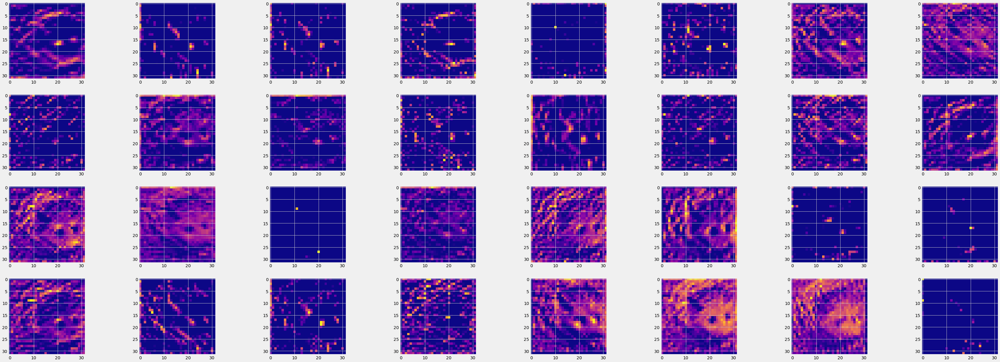


Modèle chargé!


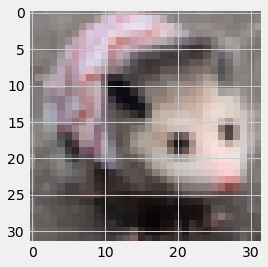


Roulement de tambour...
Prédictions :

possum : 81.98 %
keyboard : 13.33 %
whale : 4.69 %




In [7]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model1.h5")
print("Modèle enregistré!")

# Visualisation de l'image
layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

# Activation des filtres
activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)
fonctions.display_activation(activations, 8, 4, 0)


# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model1.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

### Modèle 2 : kernel size = 5,5
*Nous souhaitons regarder comment la taille du kernel influence nos résultats. Ici 5,5*

**THEORIE** : en agrandissant la taille du kernel nous perdons en précision

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 32, 32, 50)        3800      
_________________________________________________________________
flatten_2 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 153603    
Total params: 157,403
Trainable params: 157,403
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 3s 70ms/step - loss: 0.9967 - accuracy: 0.5907 - val_loss: 0.5260 - val_accuracy: 0.6800
Epoch 2/50
47/47 [==============================] - 3s 65ms/step - loss: 0.5538 - accuracy: 0.7607 - val_loss: 1.0556 - val_accuracy: 0.7133
Epoch 3/50
47/47 [==============================] - 3s 74ms/step - loss: 0.4860 - accuracy: 0.78

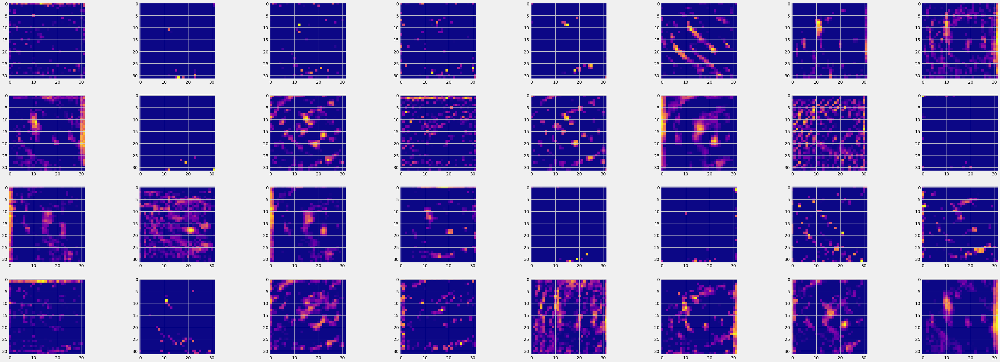


Modèle chargé!


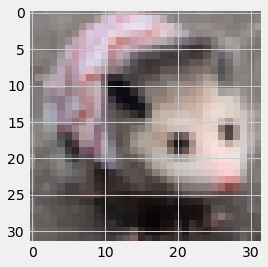


Roulement de tambour...
Prédictions :

possum : 97.71 %
whale : 2.24 %
keyboard : 0.05 %




In [8]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model2.h5")
print("Modèle enregistré!")

# Visualisation de l'image
layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model2.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

### Modèle 3 : kernel size = 7,7
*Nous souhaitons regarder comment la taille du kernel influence nos résultats. Ici 7,7*

**THEORIE** : en agrandissant la taille du kernel nous perdons en précision

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 32, 32, 50)        7400      
_________________________________________________________________
flatten_3 (Flatten)          (None, 51200)             0         
_________________________________________________________________
dense_3 (Dense)              (None, 3)                 153603    
Total params: 161,003
Trainable params: 161,003
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 4s 84ms/step - loss: 0.9022 - accuracy: 0.5787 - val_loss: 0.8208 - val_accuracy: 0.6467
Epoch 2/50
47/47 [==============================] - 4s 78ms/step - loss: 0.6091 - accuracy: 0.7273 - val_loss: 0.5264 - val_accuracy: 0.7300
Epoch 3/50
47/47 [==============================] - 4s 80ms/step - loss: 0.5000 - accuracy: 0.79

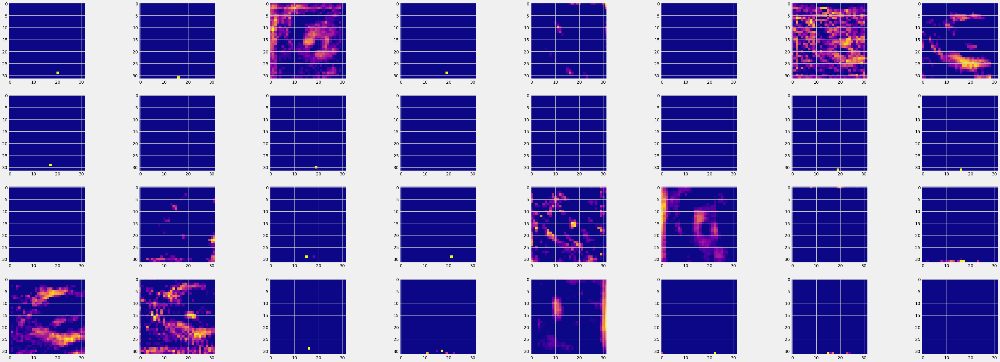


Modèle chargé!


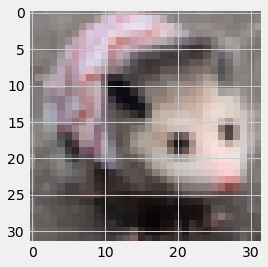


Roulement de tambour...
Prédictions :

possum : 75.45 %
whale : 18.41 %
keyboard : 6.15 %




In [9]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(7,7), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model3.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model3.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : Nous observons clairement que plus la taille du kernel est grande moins notre analyse est précise, et moins de zones sont mises en lumière. Une partie importante de l'image a été supprimée. Effectivement le modèle a plus de difficultés à reconnaître le sujet de l'image.

### Modèle 4 : Conv2D = 32

*Nous restons sur un kernel = 3,3 (car il nous semble plus pertinent), nous testons maintenant différentes valeurs pour la Conv2D (ici 32) *

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
flatten_4 (Flatten)          (None, 32768)             0         
_________________________________________________________________
dense_4 (Dense)              (None, 3)                 98307     
Total params: 99,203
Trainable params: 99,203
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 2s 41ms/step - loss: 0.7799 - accuracy: 0.6407 - val_loss: 0.4170 - val_accuracy: 0.6967
Epoch 2/50
47/47 [==============================] - 2s 41ms/step - loss: 0.5519 - accuracy: 0.7560 - val_loss: 0.3509 - val_accuracy: 0.6967
Epoch 3/50
47/47 [==============================] - 2s 40ms/step - loss: 0.4797 - accuracy: 0.7967

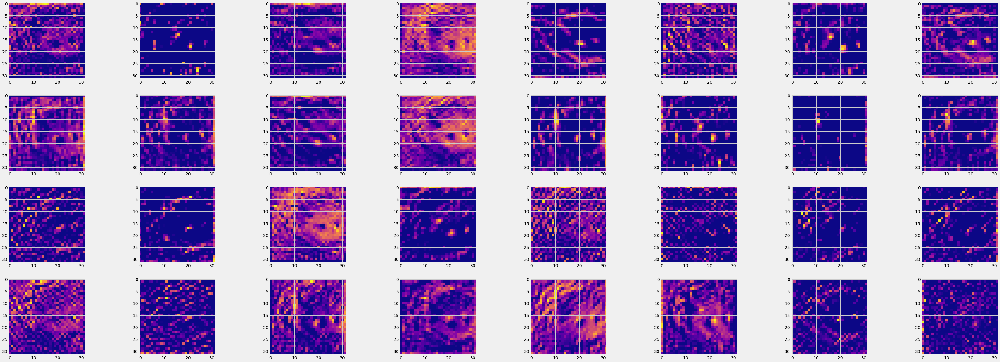


Modèle chargé!


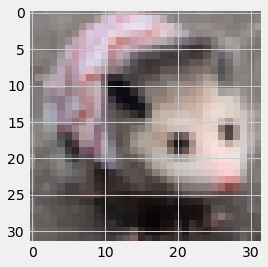


Roulement de tambour...
Prédictions :

possum : 53.75 %
whale : 27.5 %
keyboard : 18.75 %




In [10]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(32, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model4.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model4.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

### Modèle 5 : Conv2D = 64

*Nous restons sur un kernel = 3,3 (car il nous semble plus pertinent), nous testons maintenant différentes valeurs pour la Conv2D (ici 64) *

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 64)        1792      
_________________________________________________________________
flatten_5 (Flatten)          (None, 65536)             0         
_________________________________________________________________
dense_5 (Dense)              (None, 3)                 196611    
Total params: 198,403
Trainable params: 198,403
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 2s 50ms/step - loss: 1.0200 - accuracy: 0.5920 - val_loss: 0.8014 - val_accuracy: 0.6633
Epoch 2/50
47/47 [==============================] - 2s 46ms/step - loss: 0.6157 - accuracy: 0.7220 - val_loss: 0.5287 - val_accuracy: 0.6900
Epoch 3/50
47/47 [==============================] - 2s 47ms/step - loss: 0.5617 - accuracy: 0.75

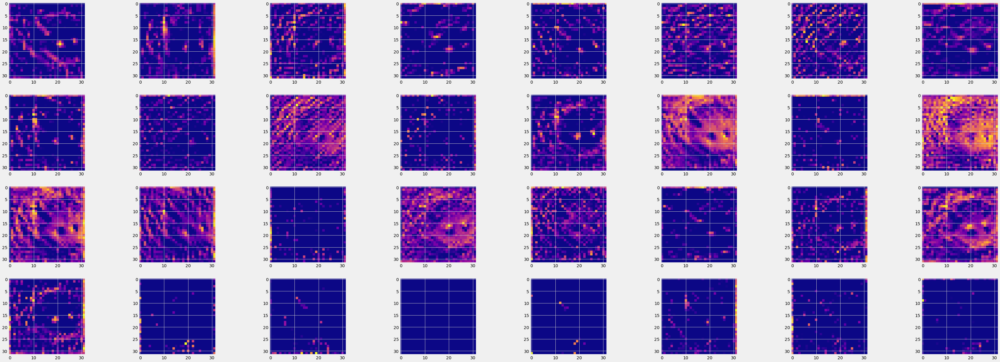


Modèle chargé!


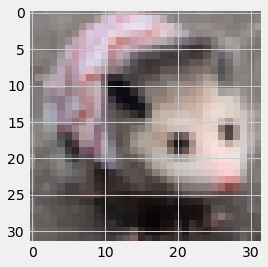


Roulement de tambour...
Prédictions :

possum : 62.61 %
whale : 20.44 %
keyboard : 16.95 %




In [11]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(64, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten()) 
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model5.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model5.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : Nous observons que la Conv2D = 64 conduit dans notre cas à une perte de détails lors de la détection, au niveau des yeux de notre opossum par exemple qui ressortent moins que précédemment.

### Modèle 6 : Conv2D = 50 +  Conv2D = 75 + kernel =  3,3
*Nous restons sur un kernel de taille 3,3 car nous pensons qu'il s'agit du choix le plus pertinent.  
Il en va de même pour la Conv2D = 50.  
Nous essayons de superposer 2 Conv2D (50 et 75) afin d'observer le résultat.*

**THEORIE** : Ajouter une seconde Conv2D permet d'accentuer la première mise en évidence.

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 32, 32, 50)        1400      
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 32, 32, 75)        33825     
_________________________________________________________________
flatten_6 (Flatten)          (None, 76800)             0         
_________________________________________________________________
dense_6 (Dense)              (None, 3)                 230403    
Total params: 265,628
Trainable params: 265,628
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 11s 233ms/step - loss: 0.8374 - accuracy: 0.6027 - val_loss: 1.0625 - val_accuracy: 0.6767
Epoch 2/50
47/47 [==============================] - 9s 200ms/step - loss: 0.5862 - accuracy: 0.7507 - v

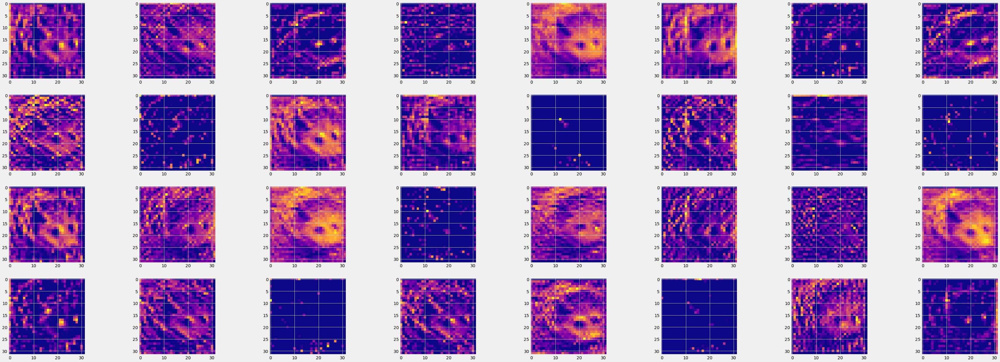

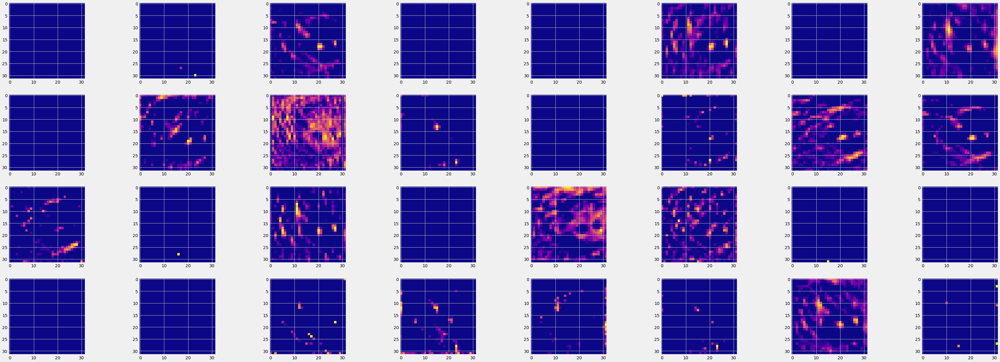


Modèle chargé!


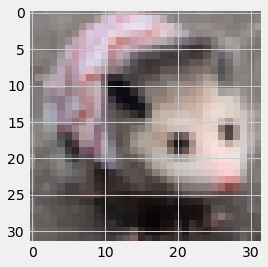


Roulement de tambour...
Prédictions :

possum : 93.93 %
whale : 5.66 %
keyboard : 0.41 %




In [12]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(75, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model6.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
fonctions.display_activation(activations, 8, 4, 1)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model6.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : Nous observons que l'ajout d'une nouvelle Conv2D réduit le bruit, les pixels parasites, pour ressortir uniquepment les contours de l'opossum.

### Modèle 7 : Conv2D = 50 +  Conv2D = 25
*Nous essayons maintenant de voir quelle valeur donner à la seconde conv2D.  
Nous commencons par lui donner une valeur plus petite que sur le modèle précédent.  *

**THEORIE** : Si nous mettons une seconde conv2D trop petite les zones d'intêrets seront trop vagues.

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 32, 32, 50)        1400      
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 32, 32, 25)        11275     
_________________________________________________________________
flatten_9 (Flatten)          (None, 25600)             0         
_________________________________________________________________
dense_9 (Dense)              (None, 3)                 76803     
Total params: 89,478
Trainable params: 89,478
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 6s 136ms/step - loss: 0.7936 - accuracy: 0.6000 - val_loss: 1.1068 - val_accuracy: 0.6533
Epoch 2/50
47/47 [==============================] - 6s 131ms/step - loss: 0.6549 - accuracy: 0.6993 - val_

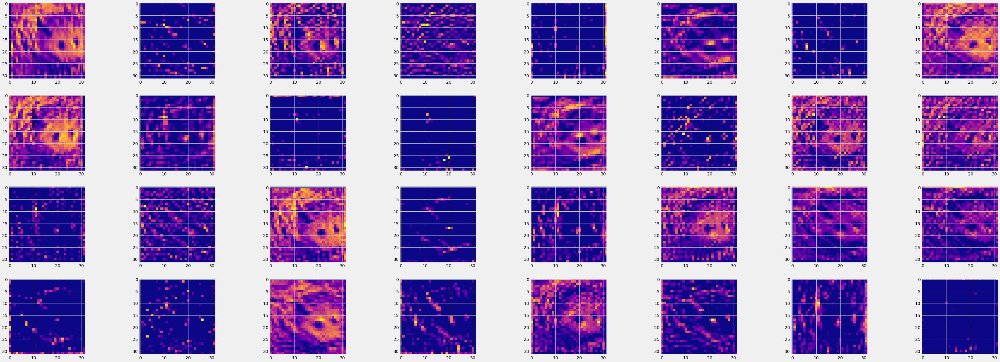


Modèle chargé!


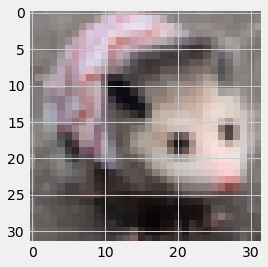


Roulement de tambour...
Prédictions :

possum : 87.01 %
whale : 9.78 %
keyboard : 3.22 %




In [15]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(25, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model7.h5")
print("Modèle enregistré!")


# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
# fonctions.display_activation(activations, 8, 4, 1)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model7.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : Nous observons que la Conv2D = 25 n'est pas visible dans l'affichage de nos couches de layers (erreur).

### Modèle 8 : Conv2D = 50 +  Conv2D = 125
*A l'inverse nous essayons maintenant d'augmenter la valeur de la seconde conv2D.  *

**THEORIE** : Si nous mettons une seconde conv2D trop grande, nous risquons d'être "trop précis" et donc d'avoir trop d'informations sur l'image à analyser.

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_22 (Conv2D)           (None, 32, 32, 50)        1400      
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 32, 32, 125)       56375     
_________________________________________________________________
flatten_14 (Flatten)         (None, 128000)            0         
_________________________________________________________________
dense_14 (Dense)             (None, 3)                 384003    
Total params: 441,778
Trainable params: 441,778
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 16s 347ms/step - loss: 0.9370 - accuracy: 0.6047 - val_loss: 0.4782 - val_accuracy: 0.7133
Epoch 2/50
47/47 [==============================] - 14s 297ms/step - loss: 0.5677 - accuracy: 0.7487 -

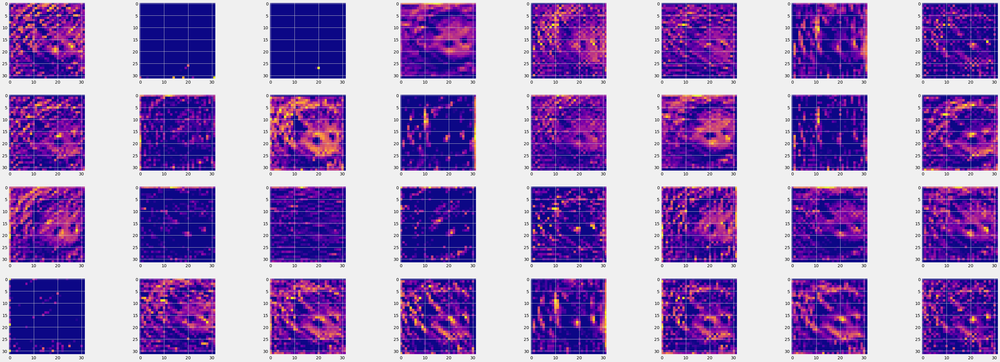

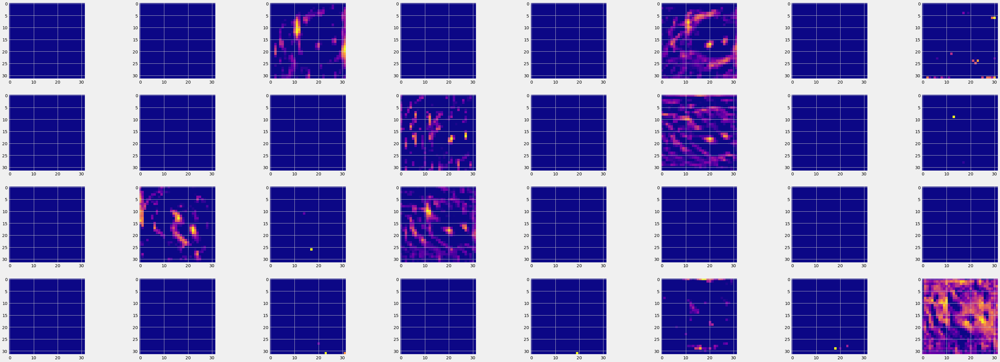


Modèle chargé!


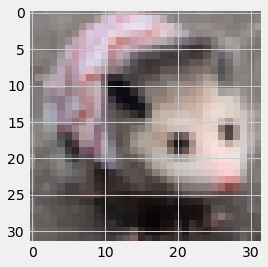


Roulement de tambour...
Prédictions :

possum : 99.98 %
whale : 0.01 %
keyboard : 0.01 %




In [20]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(125, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model8.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
fonctions.display_activation(activations, 8, 4, 1)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model8.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : L'ajout d'une seconde Conv2D supprime toujours le bruit de l'image, cette-fois-ci avec une précision accrue par rapport au test précédent (modèle 6). On distingue davantage les régions d'intérêt qui permettront la reconnaissance de l'image.

### Modèle 9 : dropout = 0.25

*En gardant les paramètres du modèle n°8, nous ajoutons un layer dropout (ici de 0.25) *

**THEORIE** : Si notre modèle devient trop précis, il peut faire un surapprentissage (donc apprendre des choses inutiles comme le bruit), nous décidons donc de lui ajouter un dropout afin de justifier cette théorie.


Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_28 (Conv2D)           (None, 32, 32, 50)        1400      
_________________________________________________________________
conv2d_29 (Conv2D)           (None, 32, 32, 125)       56375     
_________________________________________________________________
dropout_6 (Dropout)          (None, 32, 32, 125)       0         
_________________________________________________________________
flatten_17 (Flatten)         (None, 128000)            0         
_________________________________________________________________
dense_17 (Dense)             (None, 3)                 384003    
Total params: 441,778
Trainable params: 441,778
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 16s 349ms/step - loss: 0.8394 - accuracy: 0.6187 - val_loss: 

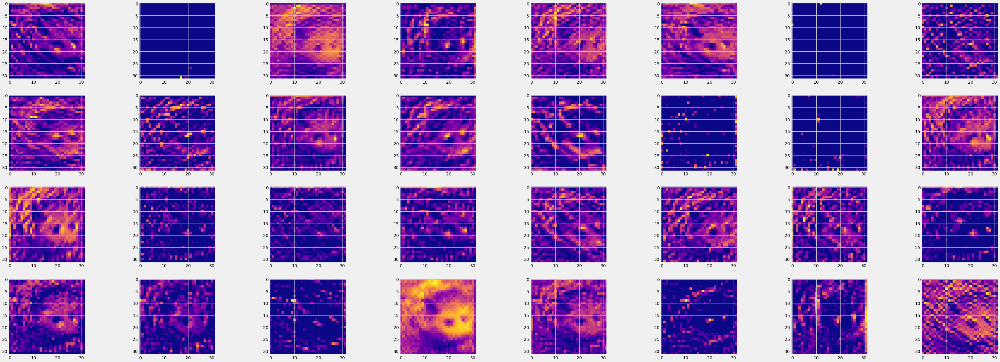

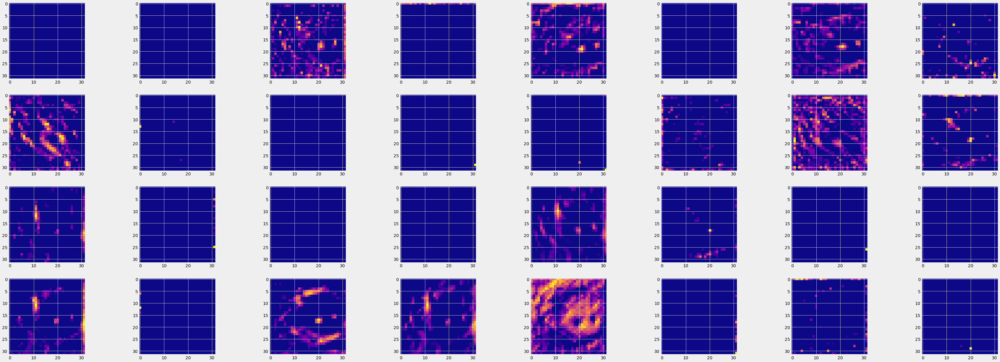

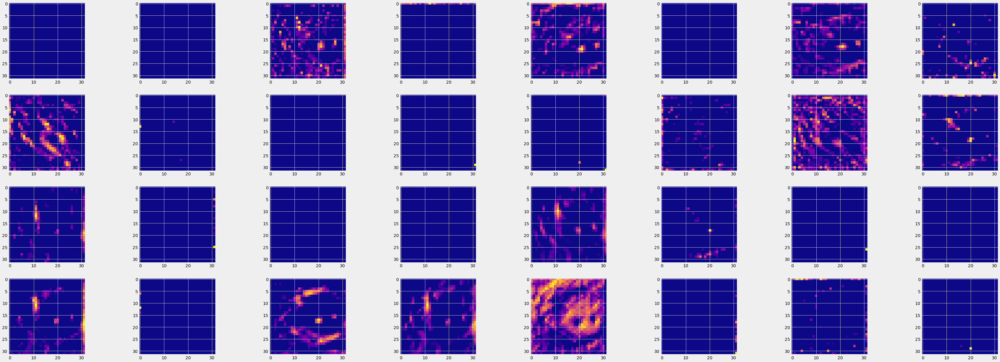


Modèle chargé!


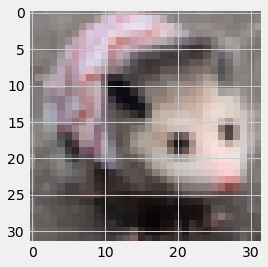


Roulement de tambour...
Prédictions :

possum : 99.61 %
whale : 0.21 %
keyboard : 0.18 %




In [23]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(125, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model9.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
fonctions.display_activation(activations, 8, 4, 1)
fonctions.display_activation(activations, 8, 4, 2)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model9.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : A l'oeil nu, la différence avant et après dropout est peu voire pas visible. Néanmoins en évitant la surcharge d'informations à notre modèle, les résultats du test semblent plus précis que le modèle 8 (sans dropout), le modèle semble d'autant plus fiable.

### Modèle 10 : dropout = 0.5

*En gardant les paramètres du modèle n°8, nous ajoutons un layer dropout (ici de 0.5) *

**THEORIE** : Si notre modèle devient trop précis, il peut faire un surapprentissage (donc apprendre des choses inutiles comme le bruit), nous décidons donc de lui ajouter un dropout afin de justifier cette théorie.


Model: "sequential_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 32, 32, 50)        1400      
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 32, 32, 125)       56375     
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 32, 125)       0         
_________________________________________________________________
flatten_11 (Flatten)         (None, 128000)            0         
_________________________________________________________________
dense_11 (Dense)             (None, 3)                 384003    
Total params: 441,778
Trainable params: 441,778
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 15s 313ms/step - loss: 0.8134 - accuracy: 0.6147 - val_loss: 

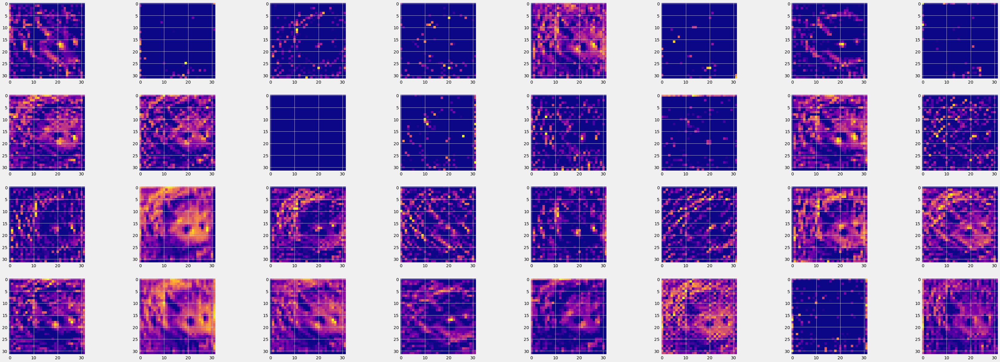

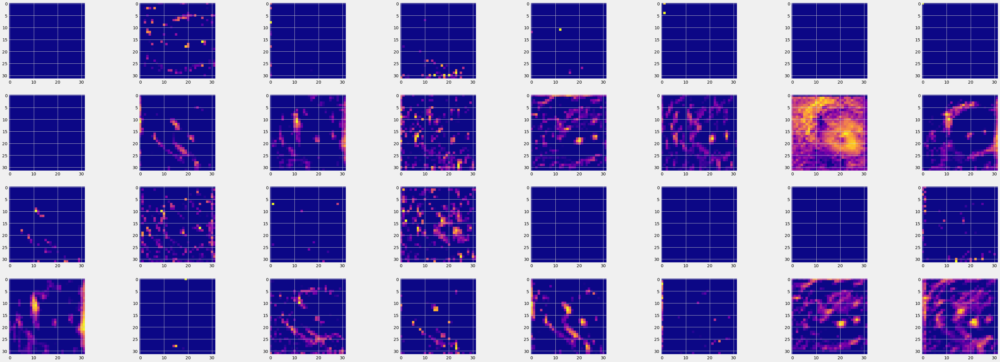

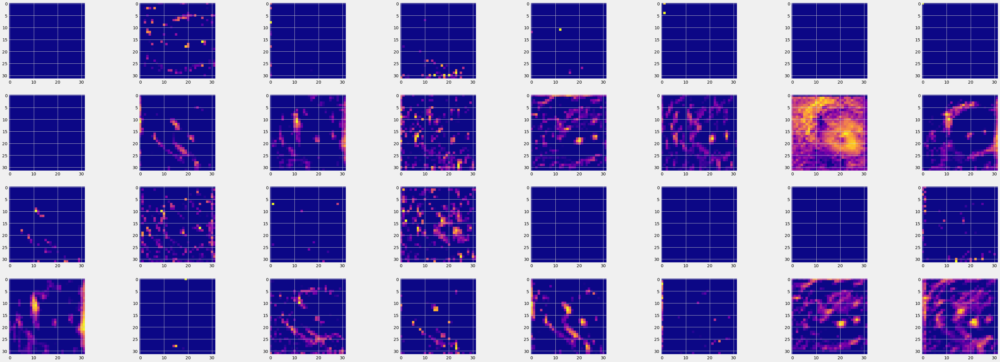


Modèle chargé!


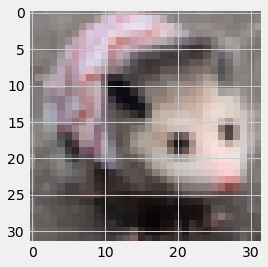


Roulement de tambour...
Prédictions :

possum : 50.2 %
whale : 36.08 %
keyboard : 13.72 %




In [17]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(125, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model10.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
fonctions.display_activation(activations, 8, 4, 1)
fonctions.display_activation(activations, 8, 4, 2)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model10.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : Si les différences ne sont toujours pas visibles à l'oeil nu, les résultats des tests indiquent clairement que nous perdons trop de valeurs pour réalisr une prédiction correcte. 

### Modèle 11 : dropout = 3

*En gardant les paramètres du modèle n°8, nous ajoutons un dropout = 3 *

**THEORIE** : Nous pensons augmenter la netteté des contours en ajoutant un dropout, ce qui devarait avoir pour effet d'éviter le suraprentissage

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_10 (Conv2D)           (None, 32, 32, 50)        1400      
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 32, 32, 125)       56375     
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 32, 125)       0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 128000)            0         
_________________________________________________________________
dense_8 (Dense)              (None, 3)                 384003    
Total params: 441,778
Trainable params: 441,778
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 13s 277ms/step - loss: 0.8846 - accuracy: 0.6220 - val_loss: 0

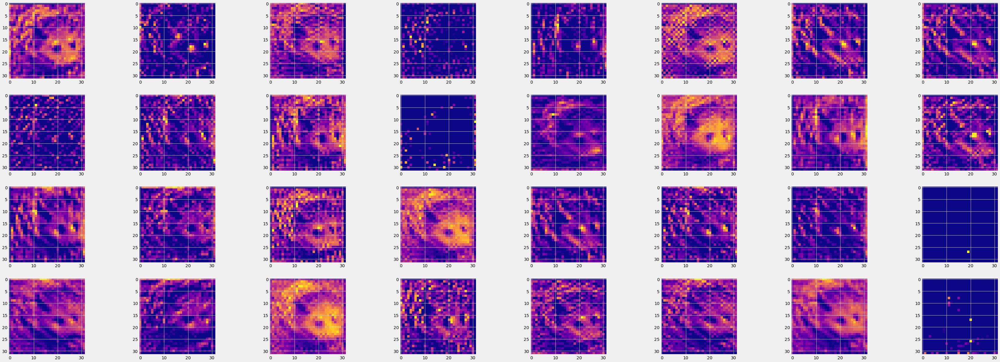

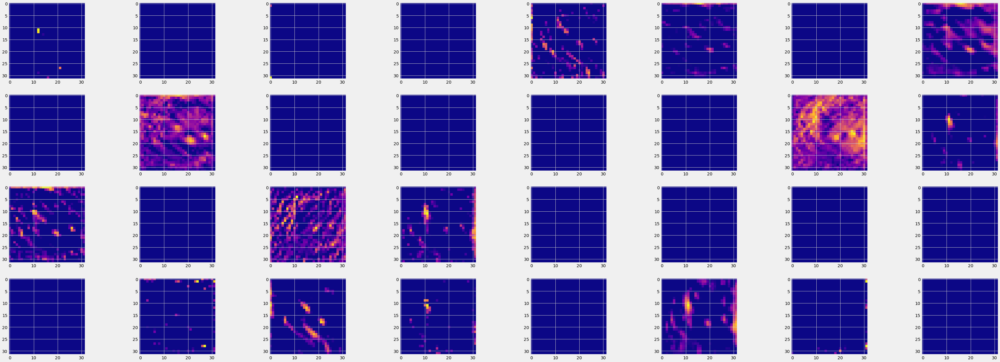

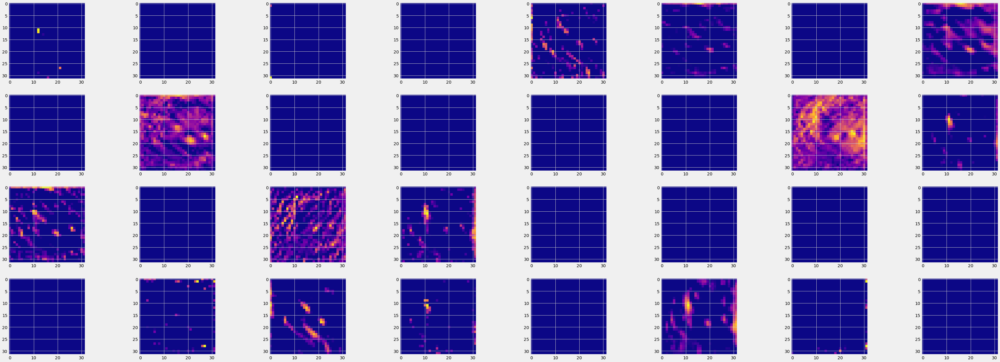


Modèle chargé!


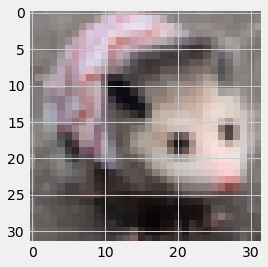


Roulement de tambour...
Prédictions :

whale : 95.52 %
keyboard : 2.53 %
possum : 1.95 %




In [14]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(125, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Dropout(3))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model11.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
fonctions.display_activation(activations, 8, 4, 1)
fonctions.display_activation(activations, 8, 4, 2)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model12.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : LOL c'est de la merde.

### Modèle 12 : strides = 3,3

*En gardant les paramètres du modèle n°8, nous augmentons la valeur des strides à 3,3 *

**THEORIE** : En augmentant les valeurs des strides les zones d'intêret sont plus grossières en raison de la taille plus importantes des pixels.

Model: "sequential_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_20 (Conv2D)           (None, 11, 11, 50)        1400      
_________________________________________________________________
conv2d_21 (Conv2D)           (None, 4, 4, 125)         56375     
_________________________________________________________________
flatten_13 (Flatten)         (None, 2000)              0         
_________________________________________________________________
dense_13 (Dense)             (None, 3)                 6003      
Total params: 63,778
Trainable params: 63,778
Non-trainable params: 0
_________________________________________________________________
Epoch 1/50
47/47 [==============================] - 1s 29ms/step - loss: 0.8783 - accuracy: 0.5807 - val_loss: 1.1103 - val_accuracy: 0.5933
Epoch 2/50
47/47 [==============================] - 1s 29ms/step - loss: 0.7127 - accuracy: 0.6773 - val_l

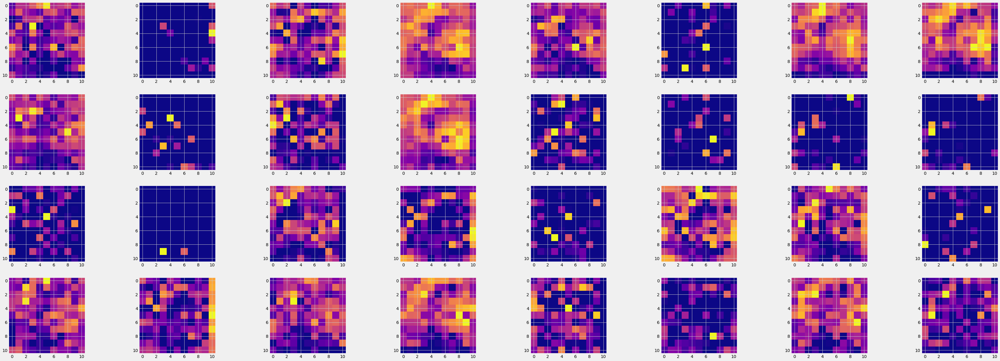

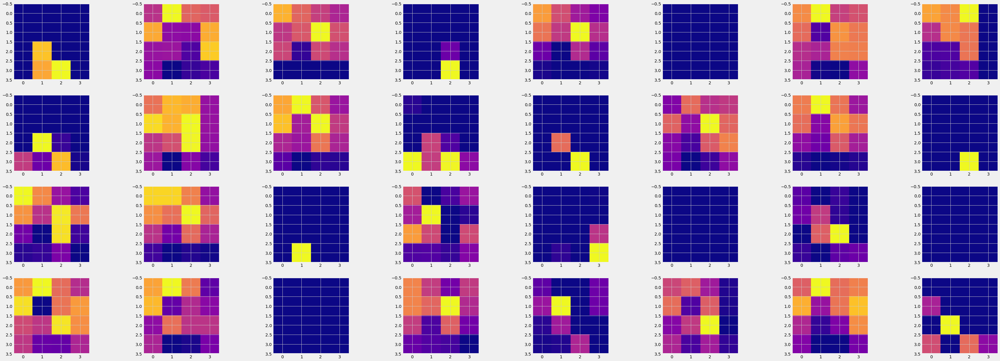


Modèle chargé!


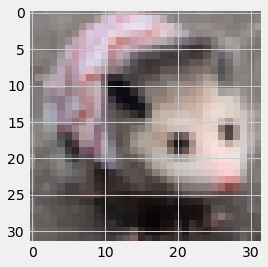


Roulement de tambour...
Prédictions :

possum : 99.94 %
whale : 0.05 %
keyboard : 0.01 %




In [19]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(3,3), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(125, kernel_size=(3,3), strides=(3,3), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model12.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
fonctions.display_activation(activations, 8, 4, 1)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model11.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

**OBSERVATION** : Les résultats du test semblent vraiment bons et précis, cependant en regardant les sorties on constate que les carés de couleur sont vraiment trop importants, ce qui sous-entend une perte conséquente de détails et zones de l'image d'origine. Nous pensons qu'il vaut mieux réduire la taille des strides.

### Modèle 13 : 2 Conv2D (50 + 125 - strides 2,2), Dropout (0.25), Maxpool2D

*Nous ajoutons aux paramètres testés en modèle 9 (2 Conv2D + Dropout) un Maxpool2D avec un poolsize de 2,2 et les strides de 2,2 appliqués à la seconde Conv2D. *

**THEORIE** : Le maxpool2D et les strides vont améliorer les performances du modèle 9, jusqu'ici le mieux étalonné.

Model: "sequential_18"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_30 (Conv2D)           (None, 32, 32, 50)        1400      
_________________________________________________________________
conv2d_31 (Conv2D)           (None, 16, 16, 125)       56375     
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 8, 8, 125)         0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 8, 8, 125)         0         
_________________________________________________________________
flatten_18 (Flatten)         (None, 8000)              0         
_________________________________________________________________
dense_18 (Dense)             (None, 3)                 24003     
Total params: 81,778
Trainable params: 81,778
Non-trainable params: 0
_________________________________________________

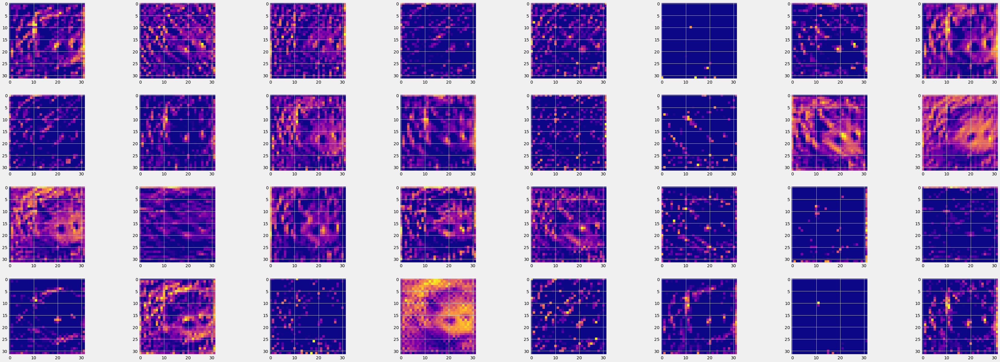

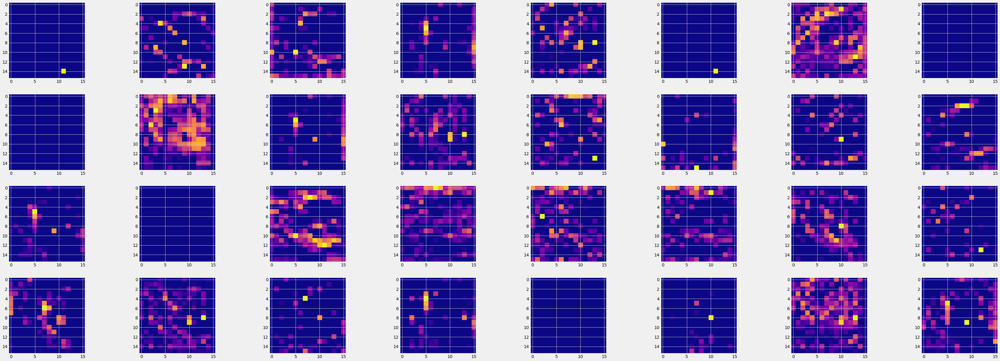

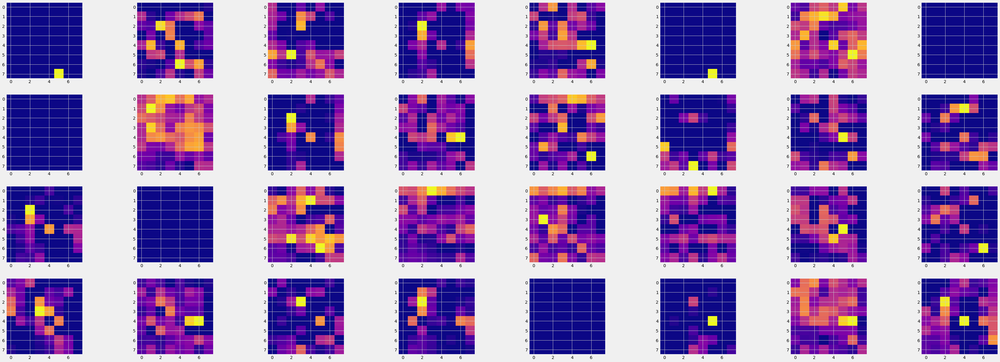


Modèle chargé!


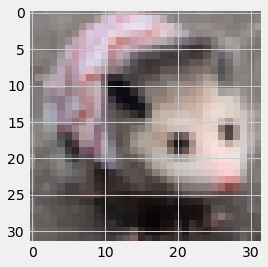


Roulement de tambour...
Prédictions :

possum : 99.61 %
whale : 0.21 %
keyboard : 0.18 %




In [24]:
# Création d'un modèle séquentiel qui se résume à une pile linéaire de couches
model = Sequential()

model.add(Conv2D(50, kernel_size=(3,3), strides=(1,1), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(Conv2D(125, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu', input_shape=(32, 32, 3)))
model.add(MaxPool2D(pool_size=(2,2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(3, activation='softmax'))

model.summary()
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer='adam')
es_callback = EarlyStopping(monitor='val_loss', patience=3)
entrainement = model.fit_generator(train_generator, epochs = epochs, callbacks=[es_callback], validation_data = test_generator)

score = model.evaluate(train_generator, verbose=0)
print("Test de perte:", score[0])
print("Test de précision:", score[1])
print("")
print("Enregistrement du modèle...")
model.save(MODELS_ROOT + "model13.h5")
print("Modèle enregistré!")

# Visualisation de l'image

layer_outputs = [layer.output for layer in model.layers]
test_image = "src/images/opossum_trop_choupi.jpg"

# Le chargement de l'image doit être augmenté puisque notre model prend des lots d'images.
img = image.load_img(test_image, target_size=(32,32, 3))
img_arr = image.img_to_array(img)
img_arr = np.expand_dims(img_arr, axis=0)

activation_model = Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_arr)

fonctions.display_activation(activations, 8, 4, 0)
fonctions.display_activation(activations, 8, 4, 1)
fonctions.display_activation(activations, 8, 4, 2)

# Nous testons maintenant notre modèle sur une image
fonctions.test_model("saved_models/model9.h5","src/images/opossum_trop_choupi.jpg", CIFAR_LITE)

# Nous arrivons à un truc qui envoie du pâtée en croûte !!!
# Nous conservons ce modèle pour la suite du projet.